In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.animation as animation
import pandas.plotting as pdplt
pdplt.register_matplotlib_converters()
from IPython.display import HTML

In [3]:
url1 = "C:\\Users\\Intel\\Desktop\\Timeseries\\owid-covid-data.csv"
url2 = "C:\\Users\\dhruv\\Downloads\\owid-covid-data.csv"
nameField = 'location'
group = 'continent'
dateField = 'date'
valueField = 'total_cases'
sample_date = "2020-07-09"
graph_Label = "Covid Cases by regions"
df = pd.read_csv(url2, usecols=[nameField, group, dateField, valueField]) 
df.tail(200)

,continent,location,date,total_cases
220367,Africa,Zimbabwe,2022-03-16,243650.0
220368,Africa,Zimbabwe,2022-03-17,243650.0
220369,Africa,Zimbabwe,2022-03-18,244012.0
220370,Africa,Zimbabwe,2022-03-19,244452.0
220371,Africa,Zimbabwe,2022-03-20,244452.0
...,...,...,...,...
220562,Africa,Zimbabwe,2022-09-27,257376.0
220563,Africa,Zimbabwe,2022-09-28,257409.0
220564,Africa,Zimbabwe,2022-09-29,257409.0
220565,Africa,Zimbabwe,2022-09-30,257465.0


In [4]:
# Replacing null values with zero
df[valueField] =  df[valueField].fillna(0)
df[group] =  df[group].fillna('-')

# allNulls.value_counts()

In [5]:
current_year = sample_date
dff = (df[df[dateField].eq(current_year)]
       .sort_values(by=valueField, ascending=True)
       .head(10))
dff

,continent,location,date,total_cases
148275,Oceania,Northern Mariana Islands,2020-07-09,0.0
161144,North America,Puerto Rico,2020-07-09,0.0
146141,Asia,North Korea,2020-07-09,0.0
79876,Oceania,Guam,2020-07-09,0.0
124787,Oceania,Marshall Islands,2020-07-09,0.0
209005,North America,United States Virgin Islands,2020-07-09,0.0
168359,North America,Saint Pierre and Miquelon,2020-07-09,1.0
5786,North America,Anguilla,2020-07-09,3.0
24722,North America,Bonaire Sint Eustatius and Saba,2020-07-09,7.0
28446,North America,British Virgin Islands,2020-07-09,8.0


<BarContainer object of 10 artists>

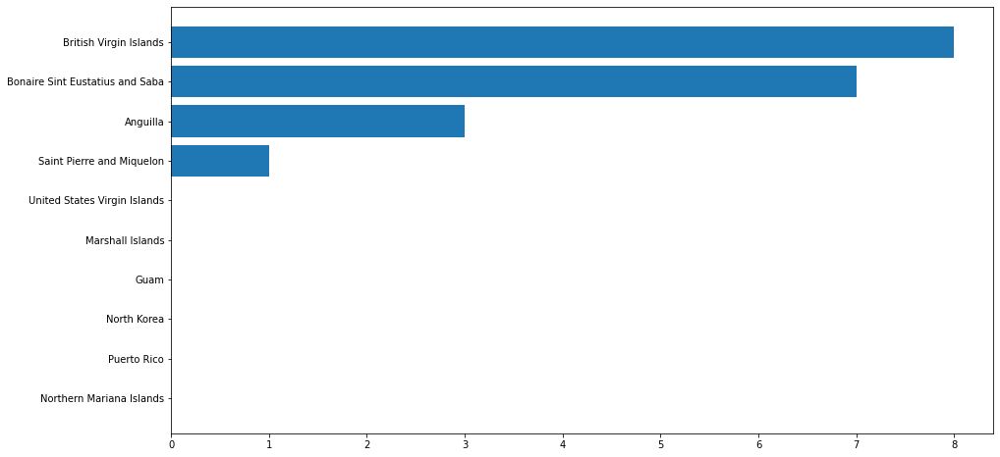

In [6]:
fig, ax = plt.subplots(figsize=(15, 8))
ax.barh(dff[nameField], dff[valueField])

In [7]:
colors = dict(zip(
    ['Oceania', 'Europe', 'Asia', 'Latin America', 'South America',
     'North America', 'Africa', '-'],
    ['#adb0ff', '#ffb3ff', '#90d595', '#e48381','#e48331',
     '#f7bb5f', '#eafb50', '#eafaa0']
))
group_lk = df.set_index(nameField)[group].to_dict()

Text(1, 0.4, '2020-07-09')

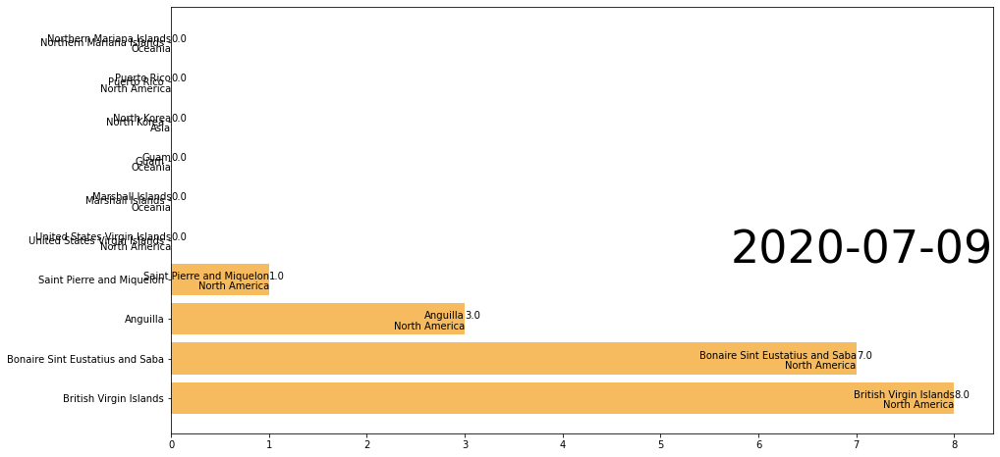

In [8]:
fig, ax = plt.subplots(figsize=(15, 8))
dff = dff[::-1]   # flip values from top to bottom
# pass colors values to `color=`
ax.barh(dff[nameField], dff[valueField], color=[colors[group_lk[x]] for x in dff[nameField]])
# iterate over the values to plot labels and values (Tokyo, Asia, 38194.2)
for i, (value, name) in enumerate(zip(dff[valueField], dff[nameField])):
    ax.text(value, i,     name,            ha='right')  # Tokyo: name
    ax.text(value, i-.25, group_lk[name],  ha='right')  # Asia: group name
    ax.text(value, i,     value,           ha='left')   # 38194.2: value
# Add year right middle portion of canvas
ax.text(1, 0.4, current_year, transform=ax.transAxes, size=46, ha='right')

In [9]:
df[df[dateField].eq('2020-11-11')].sort_values(by=valueField, ascending=True).tail(10)

,continent,location,date,total_cases
90871,Asia,India,2020-11-11,8683916.0
183605,-,South America,2020-11-11,10139239.0
208208,North America,United States,2020-11-11,10482537.0
145353,-,North America,2020-11-11,12450140.0
63894,-,Europe,2020-11-11,12938222.0
116474,-,Lower middle income,2020-11-11,13231945.0
10738,-,Asia,2020-11-11,14750061.0
210010,-,Upper middle income,2020-11-11,15640115.0
86087,-,High income,2020-11-11,23066293.0
217118,-,World,2020-11-11,52238985.0


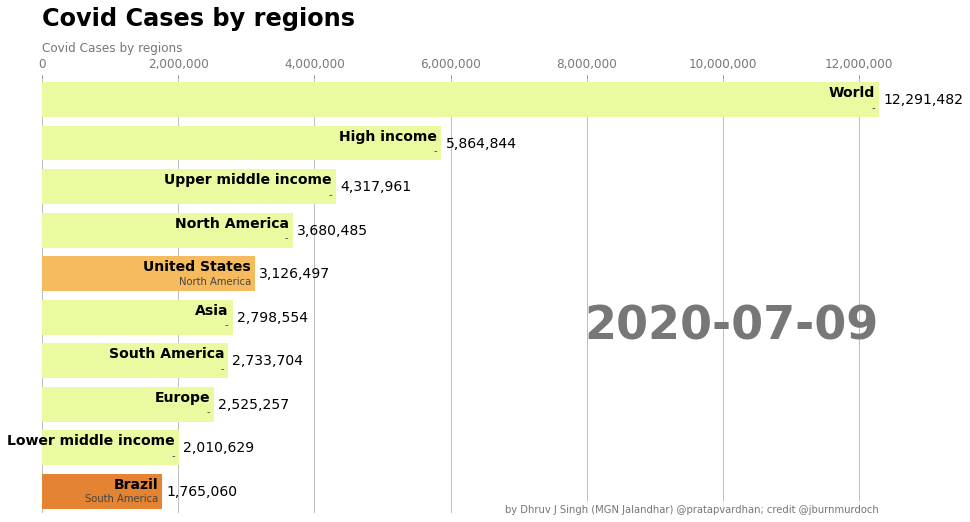

In [10]:
fig, ax = plt.subplots(figsize=(15, 8))
def draw_barchart(year):
    dff = df[df[dateField].eq(year)].sort_values(by=valueField, ascending=True).tail(10)
    ax.clear()
    ax.barh(dff[nameField], dff[valueField], color=[colors[group_lk[x]] for x in dff[nameField]])
    dx = dff[valueField].max() / 200
    for i, (Population1, name1) in enumerate(zip(dff[valueField], dff[nameField])):
        ax.text(Population1-dx, i,     name1,           size=14, weight=600, ha='right', va='bottom')
        ax.text(Population1-dx, i-.25, group_lk[name1], size=10, color='#444444', ha='right', va='baseline')
        ax.text(Population1+dx, i,     f'{Population1:,.0f}',  size=14, ha='left',  va='center')
    # ... polished styles
    ax.text(1, 0.4, year, transform=ax.transAxes, color='#777777', size=46, ha='right', weight=800)
    ax.text(0, 1.06, graph_Label, transform=ax.transAxes, size=12, color='#777777')
    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
    ax.xaxis.set_ticks_position('top')
    ax.tick_params(axis='x', colors='#777777', labelsize=12)
    ax.set_yticks([''])
    ax.margins(0, 0.01)
    ax.grid(which='major', axis='x', linestyle='-')
    ax.set_axisbelow(True)
    ax.text(0, 1.12, graph_Label,
            transform=ax.transAxes, size=24, weight=600, ha='left')
    ax.text(1, 0, 'by Dhruv J Singh (MGN Jalandhar) @pratapvardhan; credit @jburnmurdoch', transform=ax.transAxes, ha='right',
            color='#777777', bbox=dict(facecolor='white', alpha=0.8, edgecolor='white'))
    plt.box(False)
    
draw_barchart(current_year)

In [20]:
import datetime
date_list = []
def loadData(year, day, month, numdays):
    base = datetime.datetime(year, month, day).date()
    for x in range(numdays):
        y = base + datetime.timedelta(days=x)
        date_list.append(y.strftime('%Y-%m-%d'))
    return date_list
loadData(2020, 3, 3, 240)
# type(date_list)
# t.strftime('%Y-%m-%d')
print('Date range generated for ' + str(len(date_list)) + " dates")

Date range generated for 240 dates


The script in the next cell will take around 3-4 minutes to run on a reasonably good machine with 16GB+ memory and i7 processor wth a 4GB graphics card.
Hence In case you are running on a low end machine, Please change loadData(2020, 3, 3, 940) to something like loadData(2020, 3, 3, 240)
- Dhruv

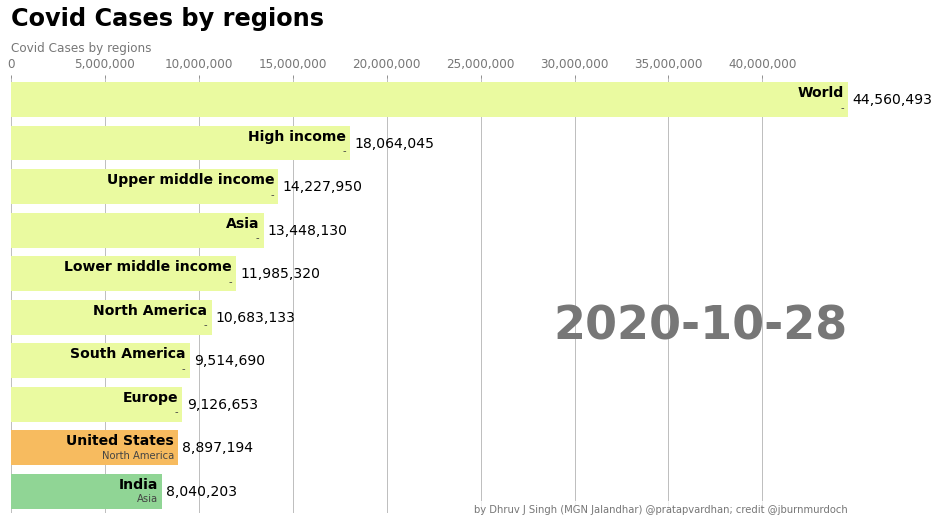

In [21]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
plt.rcParams['animation.embed_limit'] = 2**128
fig, ax = plt.subplots(figsize=(15, 8))
animator = animation.FuncAnimation(fig, draw_barchart, frames=date_list)
HTML(animator.to_jshtml()) 